# Multi-class DOG Breed Classifcation

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we are using is from Kaggle's Dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some info about the data:
* we are dealing with images (unstructured data) so we are use deep learning /transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classses)

* There are 10,000+ images in training set. (labeled data)
* There are 10,000+ images in test set. (unlabelled data)



In [ ]:
# Install compatible versions...
# %pip uninstall -y numpy
# %pip install numpy==1.25.2 --force-reinstall --no-cache-dir
%pip install tensorflow==2.15.0 keras==2.15.0 tensorflow-hub==0.15.0 numpy==1.25.2

In [ ]:
# Import tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version: " ,tf.__version__)
print("TF Hub Version: " , hub.__version__)

# Check GPU availibility
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF Version:  2.15.0
TF Hub Version:  0.15.0
GPU not available


## Getting ou data ready(turning into Tensors)

With all ML models, our data needs to be converted in numerical format. Turning images into Tensors (numerical representations).


Let's start by accesssing our data and checking out the labels.

In [ ]:
# checkout the labels of our data
import pandas as pd
label_csv=pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
print(label_csv.head())
print(label_csv.describe())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

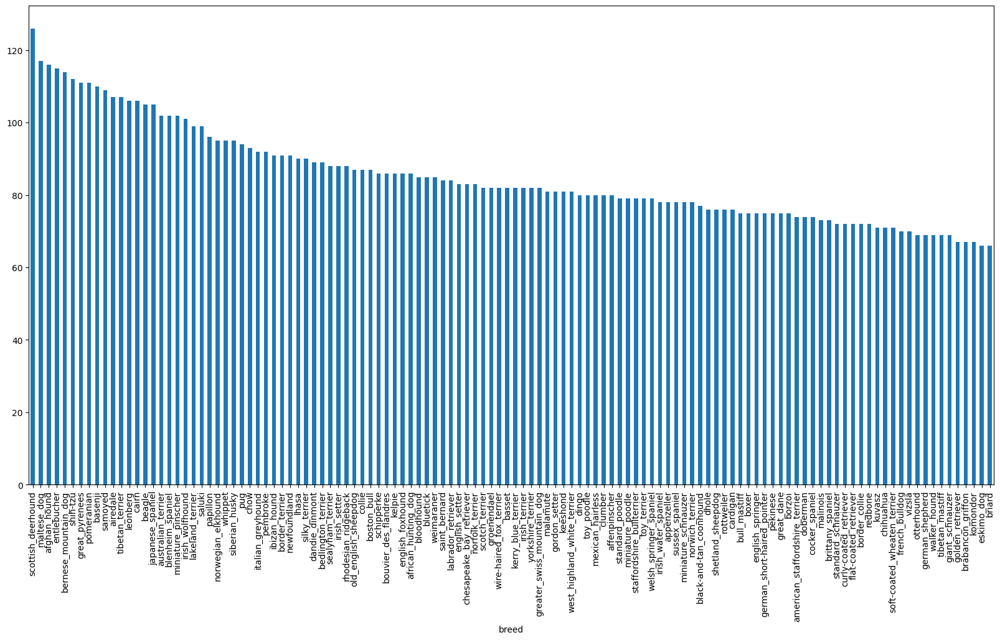

In [ ]:
# How many images are there for each breed
label_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
label_csv['breed'].value_counts().median()

82.0

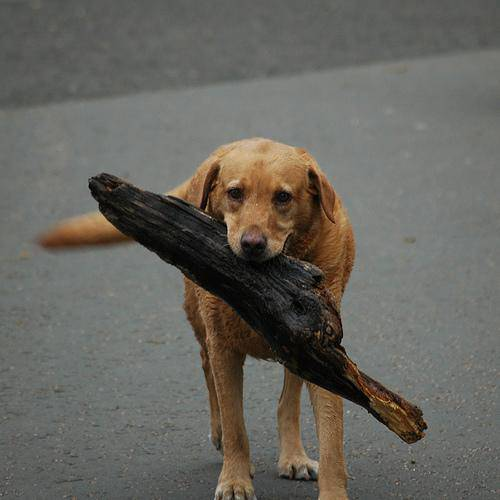

In [ ]:
# View a Image
from IPython.display import Image
Image('drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg')

## Getting images and their labels
A list of all our Image file pathnames.

In [ ]:
# Create pathnames from images ID's
filenames=["drive/MyDrive/Dog Vision/train/" + fname for fname in label_csv['id'] + '.jpg']

filenames[:5]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
# check whether number of filenames matches numbers of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog Vision/train/')) == len(filenames):
  print("Number of labels == number of images")
else:
  print("Number of labels != number of images")


Number of labels == number of images


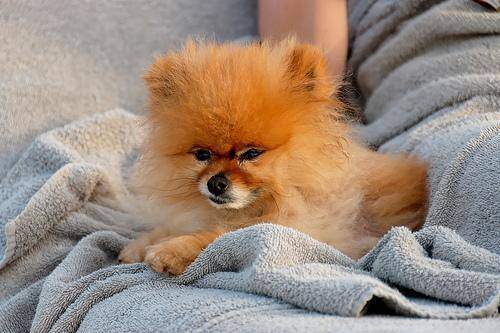

In [ ]:
Image(filenames[8000])

Now prepare our labels.


In [ ]:
import numpy as np
labels=label_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# check whether number of filenames matches numbers of labels
if len(labels) == len(filenames):
  print("Number of labels == number of images")
else:
  print("Number of labels != number of images")

Number of labels == number of images


In [ ]:
# Find unique labels values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn evry labels into a boolean array
boolean_labels=[label== unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [ ]:
#SETUP x and y
x=filenames
y=boolean_labels

1st experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [ ]:
# split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of size NUM_IMAGEs
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing Images (turning images into Tensors)

TO preprocess images we need to write the following functions:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image(convert color channel from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

Load Iamge Docs: https://www.tensorflow.org/tutorials/load_data/images


In [ ]:
# Convert iamge to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# turn image to tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image size (send image in the same form as model was trained on)
IMG_SIZE=224

# Create a functions for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # read in an image file
  image=tf.io.read_file(image_path)
  # turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image=tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image, tf.float32)
  # resize the image to our desired size (244,244)
  image=tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning our Data into Batches

Why  turn our data into batches?

10,000+ images in one go might not fit in the memory

That's why we do about 32 (this is the batch size)
iamges at a time (you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need our data in the form of Tensor tupple which look like this: `(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  image=process_image(image_path)
  return image,label

In [ ]:
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

A function to turn all our data (`x` & `y`) into batches!

In [ ]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs
  shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #if the data is a valid dataset, no nedd to shuffle it(to make validation set std for performance measurement)
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                             tf.constant(y))) # labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                             tf.constant(y))) # labels

    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(x))

    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch


In [ ]:
# Create training and validation data batches
train_data=create_data_batches(x_train, y_train)
val_data=create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
#Check out the diff attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batches
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # setup the figure
  plt.figure(figsize=(10,10))
  # loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots
    ax=plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])

In [ ]:
train_images, train_labels= next(train_data.as_numpy_iterator())

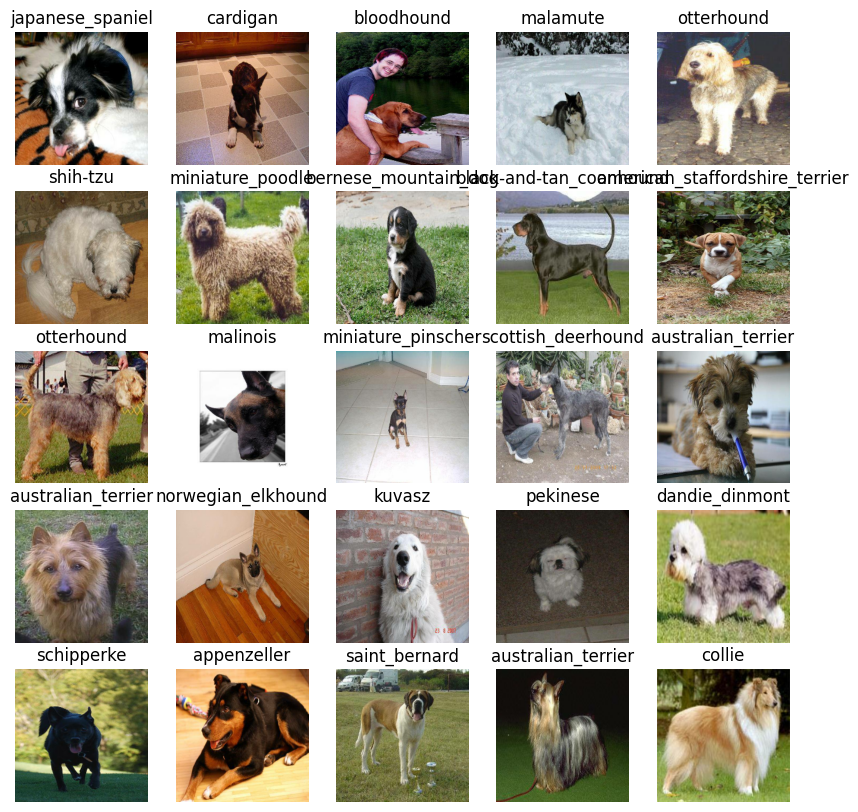

In [ ]:
show_25_images(train_images, train_labels)

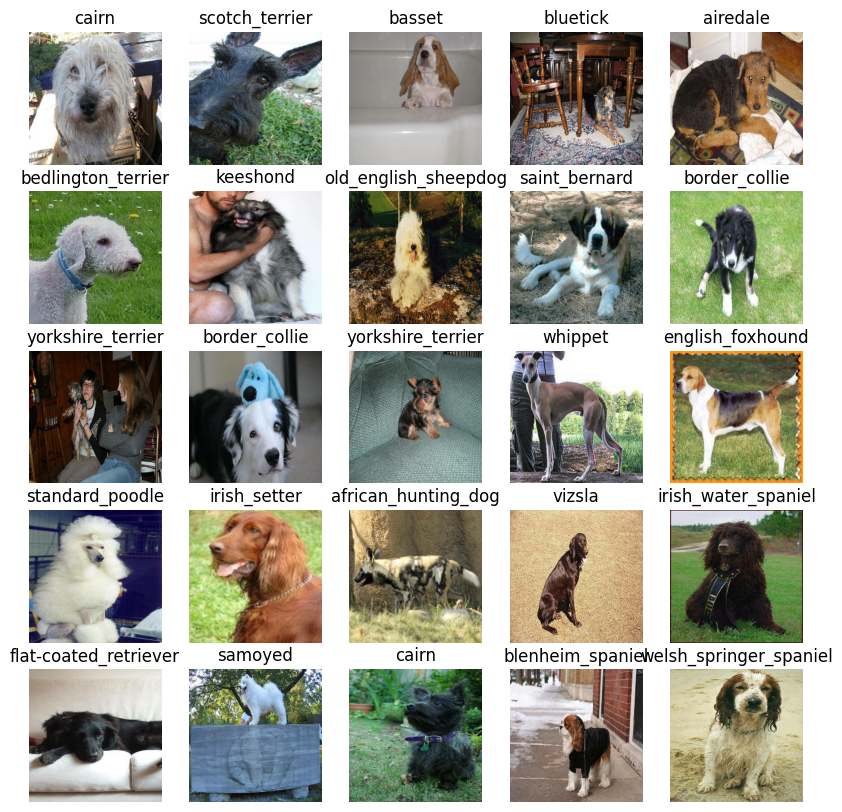

In [ ]:
val_images, val_labels= next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The Input shape(our img shape, in the form of tensors) to our model.
* the output shape(img labels, in form of tensors) of our model.
* The URL of the model we want to use.

In [ ]:
# Setup nput shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #batch,height,width, color channels

#Setup output shape
OUTPUT_SHAPE=len(unique_breeds)

# Setup model URL
MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Put inputs,  outputs, and model together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters
* Defines the layers in a keras model in sequential fashion(do this first, then this, then that).
* compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it,will be getting).
* Return the model.

In [ ]:
#Create a function which builds a Keras Model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

### Tensorboard Callback
To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training  a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

Let's create a simple function which trains a model. The function will:

* Create a model using create_model().
* Setup a TensorBoard callback using create_tensorboard_callback() (we do this here so it creates a log directory of the current date and time).
* Call the fit() function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# BUILD a function to tarin and return a trained model
def train_model():
  """
  Train a given model and returns the trained version
  """
  #Create a model
  model =create_model()

  #create new Tensorboard session everytime we train a model
  tensorboard =create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we craeted
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # return fitted model
  return model

In [ ]:
# FIt the model to the data
model= train_model()

**Question**: It looks like our model might be overfitting (getting far better results on the training set than the validation set), what are some ways to prevent model overfitting? Hint: this may involve searching something like "ways to prevent overfitting in a deep learning model?".

**Note** : Overfitting to begin with is a good thing. It means our model is learning something.



Checking the TensorBoard logs
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and viualize its contents.


In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model
Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

Making predictions with a trained model is as calling predict() on it and passing it data in the same format the model was trained on.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

In [ ]:
# Check the shape of predictions
predictions.shape

Making predictions with our model returns an array with a different value for each label.

In this case, making predictions on the validation data (200 images) returns an array (predictions) of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Let's see how we'd convert an array of probabilities into an actual label.

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the fit() function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now, we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

We'll create a function which:

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using get_pred_label().
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [ ]:
# Let check out few predictions and their different values
i_multipliers=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multipliers)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multipliers)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model
After training a model, it's a good idea to save it. Saving it means you won't have to go through the potentially expensive step of retraining it.

The format of an entire saved Keras model is h5. So we'll make a function which can take a model as input and utilise the save() method to save it as a h5 file to a specified directory.

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

In [ ]:
# Load our model trained on 1000 images
model_1000_images = load_model('/content/drive/MyDrive/Dog Vision/models/20250725-06431753425812-1000-images-mobilenetv2-Adam.h5')

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

# Training a model (on the full data)
Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to X and all of the training labels to y. Let's check them out.

In [ ]:
len(x), len(y)

In [ ]:
#Create data batches
full_data= create_data_batches(x,y)

In [ ]:
full_model = create_model()

In [ ]:
# Creating callbacks

#Tensorboard Callback
full_model_tensorboard=create_tensorboard_callback()

# Early stopping calback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

**Note**: Running below cell will take a long time.

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

In [ ]:
# Save model to file
save_model(full_model, suffix="all-images-mobilenetv2-Adam")

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20250725-09491753436958-all-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20250725-09491753436958-all-images-mobilenetv2-Adam.h5


## Making  Predictions on the test Datasets

---
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.



In [ ]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e96fd30110107e506de94d81af346238.jpg',
 'drive/MyDrive/Dog Vision/test/e850770a6575a34b1c7ad4b401692553.jpg',
 'drive/MyDrive/Dog Vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Dog Vision/test/efac70ee513c40265966b89d715f183e.jpg',
 'drive/MyDrive/Dog Vision/test/eac53a0ba2df1689f98f8e7f8ebb90c2.jpg',
 'drive/MyDrive/Dog Vision/test/ead86e148dabfcc4ef7f4dcdce9fcf57.jpg',
 'drive/MyDrive/Dog Vision/test/ea0a254533e645588e739dbdd0e3d3fa.jpg',
 'drive/MyDrive/Dog Vision/test/eeb72cc64e4b26bf721196dfcb324e82.jpg',
 'drive/MyDrive/Dog Vision/test/ef9de7d5f286c09daf1807e2ae67c98d.jpg',
 'drive/MyDrive/Dog Vision/test/ea3dd88512f22e94969a517e8e8ea10e.jpg']

In [ ]:
len(test_filenames)

10231

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Since there are 10,000+ test images, making predictions could take a while, even on a GPU. So beware running the cell below may take up to an hour.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

320/320 [==============================] - 969s 3s/step


In [ ]:
# Save Predictions (Numpy array) to csv file(for access later)
np.savetxt('drive/MyDrive/Dog Vision/test_predictions.csv', test_predictions, delimiter=',')

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog Vision/test_predictions.csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[2.03478848e-11, 1.55951640e-11, 9.99995887e-01, ...,
        3.83609411e-09, 6.76035547e-11, 1.11148339e-11],
       [1.48953445e-08, 1.36635445e-05, 3.01103782e-08, ...,
        3.34090117e-07, 8.82821041e-06, 2.38985012e-04],
       [3.20449319e-16, 1.64114572e-13, 2.13244822e-15, ...,
        9.38936103e-13, 8.41600281e-14, 2.81986400e-17],
       ...,
       [2.25104102e-10, 3.75647389e-08, 7.29737992e-10, ...,
        5.42854423e-07, 2.64530172e-06, 2.83124257e-09],
       [1.29567013e-14, 1.35169273e-07, 6.11267710e-13, ...,
        3.23020647e-12, 1.39593979e-07, 1.92584195e-11],
       [5.02973840e-09, 3.05690691e-08, 1.42862439e-06, ...,
        2.13283405e-10, 4.85954217e-07, 4.19761986e-02]])

In [ ]:
test_predictions.shape

(10231, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_path = "drive/MyDrive/Dog Vision/test"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e96fd30110107e506de94d81af346238,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e850770a6575a34b1c7ad4b401692553,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7fcdf9671a6593b638cbee42842f981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,efac70ee513c40265966b89d715f183e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,eac53a0ba2df1689f98f8e7f8ebb90c2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e96fd30110107e506de94d81af346238,2.034788e-11,1.559516e-11,9.999959e-01,7.623255e-12,8.107913e-10,1.211463e-12,2.220702e-10,4.590040e-12,2.829799e-13,...,6.033397e-10,1.703297e-11,9.644919e-12,1.839828e-12,6.498374e-10,2.815636e-12,9.092502e-12,3.836094e-09,6.760355e-11,1.111483e-11
1,e850770a6575a34b1c7ad4b401692553,1.489534e-08,1.366354e-05,3.011038e-08,9.815931e-06,5.889805e-09,1.454114e-08,2.197483e-05,4.762927e-09,3.062329e-09,...,1.734316e-07,3.694757e-08,2.953343e-06,4.474800e-07,1.123449e-07,8.036871e-03,2.007294e-09,3.340901e-07,8.828210e-06,2.389850e-04
2,e7fcdf9671a6593b638cbee42842f981,3.204493e-16,1.641146e-13,2.132448e-15,4.744266e-14,1.927805e-14,8.632048e-14,1.800277e-14,2.350052e-14,3.830006e-12,...,8.468128e-17,1.911192e-16,1.771081e-16,3.537132e-13,5.882956e-17,9.999999e-01,7.092191e-14,9.389361e-13,8.416003e-14,2.819864e-17
3,efac70ee513c40265966b89d715f183e,6.226158e-12,3.550784e-10,1.966002e-08,1.182644e-07,1.290713e-08,4.917661e-10,1.775388e-10,3.041922e-11,4.181551e-05,...,6.503159e-10,6.205453e-10,8.189298e-01,6.586626e-05,1.787090e-01,2.002939e-12,6.863820e-10,1.534316e-09,1.004130e-07,1.172828e-08
4,eac53a0ba2df1689f98f8e7f8ebb90c2,2.870811e-08,8.026249e-10,1.911019e-07,3.714042e-12,8.541996e-09,1.075723e-08,1.818391e-07,2.238636e-06,4.527576e-06,...,4.704529e-11,4.541498e-11,9.986671e-11,6.829563e-09,1.249934e-10,8.191402e-08,1.467425e-08,8.421674e-11,2.041685e-07,3.914080e-12


In [ ]:
preds_df.to_csv("drive/My Drive/Dog Vision/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

## Making predictions on custom images

To make predictions on custom image, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to True.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

Note: To make predictions on custom images, I've uploaded pictures of my own to a directory located at `drive/My Drive/Dog Vision/dogs/` (as seen in the cell below).

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/Dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'golden_retriever', 'labrador_retriever']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

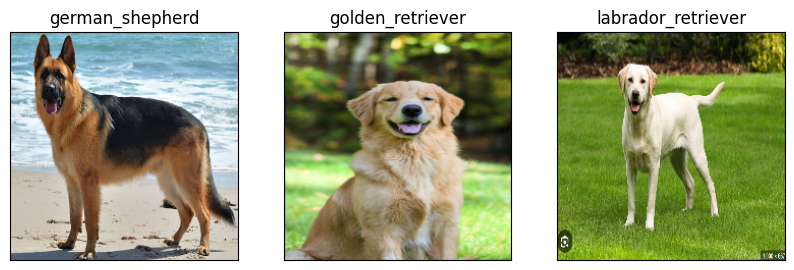

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)